# Overview of datasets

This notebook gives an at-a-glance overview of datasets by visualizing their conditions and control on UMAPs.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import anndata as ad
import scanpy as sc
import pertpy as pt
import pandas as pd
from tqdm import tqdm

from utils import scanpy_setup

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

In [3]:
sc.logging.print_header()

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [4]:
from itertools import cycle
import matplotlib.pyplot as plt

specific_colors = {
    'control': 'darkslateblue',
}
    
def plot(adata, groupby):
    """Plots UMAP for the adata, highlighting a specified grouping and ensuring
    consistent coloring for the 'control' group in the 'perturbation' column."""
    adata.obs[groupby] = adata.obs[groupby].astype('category')
    sc.pl.umap(adata, size=10, color=[groupby], palette='viridis')
    
    # always assign the same color to control
    all_categories = adata.obs['perturbation'].cat.categories
    remaining_categories = set(all_categories) - set(specific_colors.keys())
    color_cycle = cycle(plt.cm.tab20.colors)
    color_map = {**specific_colors}
    for category in remaining_categories:
        color_map[category] = next(color_cycle)

    print(len(adata.obs.perturbation.unique()))
    sc.pl.umap(adata, size=10, color='perturbation', groups=['control'], palette=color_map, na_in_legend=False, title='control', legend_loc='none')

## sciplex

In [5]:
def process_sciplex(adata, cell_line):
    if cell_line == 'A549':  # two doses in here, we only want the 24hr                                                                                                                                                                                     
        adata = adata[adata.obs.time == 24]

    adata = adata[adata.obs.cell_line == cell_line]
    sc.pp.filter_genes(adata, min_cells=100)
    sc.pp.filter_cells(adata, min_genes=200)

    # separate out the perturbations by dose                                                                                                                                                                                                                
    adata.obs['perturbation_name'] = adata.obs.perturbation.values
    adata.obs['perturbation'] = adata.obs['perturbation_name'].astype(str) + '_' + adata.obs.dose_value.astype(str)
    adata.obs['perturbation'] = adata.obs['perturbation'].replace({'control_0.0':'control'})

    adata.obs['log10(dose_value)'] = np.log10(adata.obs['dose_value'])
    return adata

In [6]:
cell_line = 'K562'
adata = pt.data.srivatsan_2020_sciplex3()
adata = process_sciplex(adata, cell_line)

In [7]:
adata

AnnData object with n_obs × n_vars = 173149 × 20192
    obs: 'ncounts', 'well', 'plate', 'cell_line', 'replicate', 'time', 'dose_value', 'pathway_level_1', 'pathway_level_2', 'perturbation', 'target', 'pathway', 'dose_unit', 'celltype', 'disease', 'cancer', 'tissue_type', 'organism', 'perturbation_type', 'ngenes', 'percent_mito', 'percent_ribo', 'nperts', 'chembl-ID', 'n_genes', 'perturbation_name', 'log10(dose_value)'
    var: 'ensembl_id', 'ncounts', 'ncells', 'n_cells'

In [8]:
adata[adata.obs.replicate == 'rep1'].obs.dose_value.value_counts()

dose_value
10.0       24890
100.0      23938
1000.0     22796
10000.0    20817
0.0         2063
Name: count, dtype: int64

In [9]:
adata[adata.obs.replicate == 'rep2'].obs.perturbation.value_counts()

perturbation
control                                                 1864
Zileuton_100.0                                           162
Divalproex Sodium_1000.0                                 162
Obatoclax Mesylate (GX15-070)_100.0                      156
PD98059_10.0                                             153
                                                        ... 
Patupilone (EPO906, Epothilone B)_10.0                    17
Bisindolylmaleimide IX (Ro 31-8220 Mesylate)_10000.0      16
Flavopiridol HCl_1000.0                                   14
SGI-1776 free base_10000.0                                13
Flavopiridol HCl_10000.0                                   2
Name: count, Length: 753, dtype: int64

In [8]:
%%time
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


CPU times: user 5min 42s, sys: 1min 48s, total: 7min 31s
Wall time: 3min 29s


/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


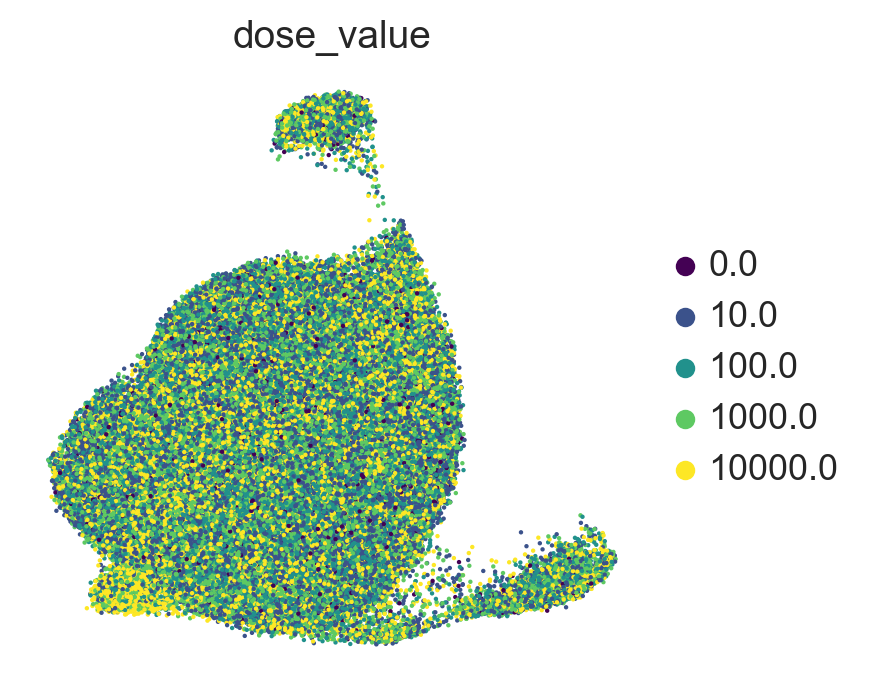

753


/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


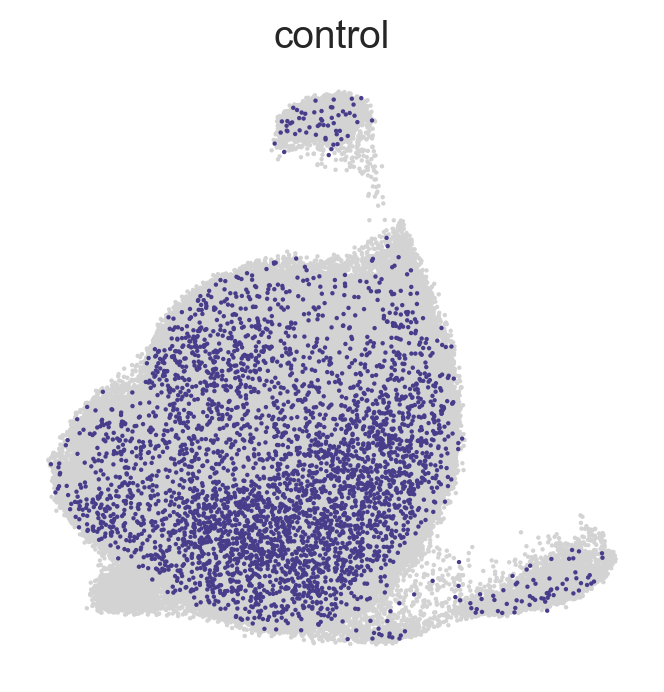

In [9]:
plot(adata, 'dose_value')

In [11]:
cell_line = 'A549'
adata = pt.data.srivatsan_2020_sciplex3()
adata = process_sciplex(adata, cell_line)

In [12]:
%%time
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

CPU times: user 4min 48s, sys: 1min 29s, total: 6min 17s
Wall time: 3min


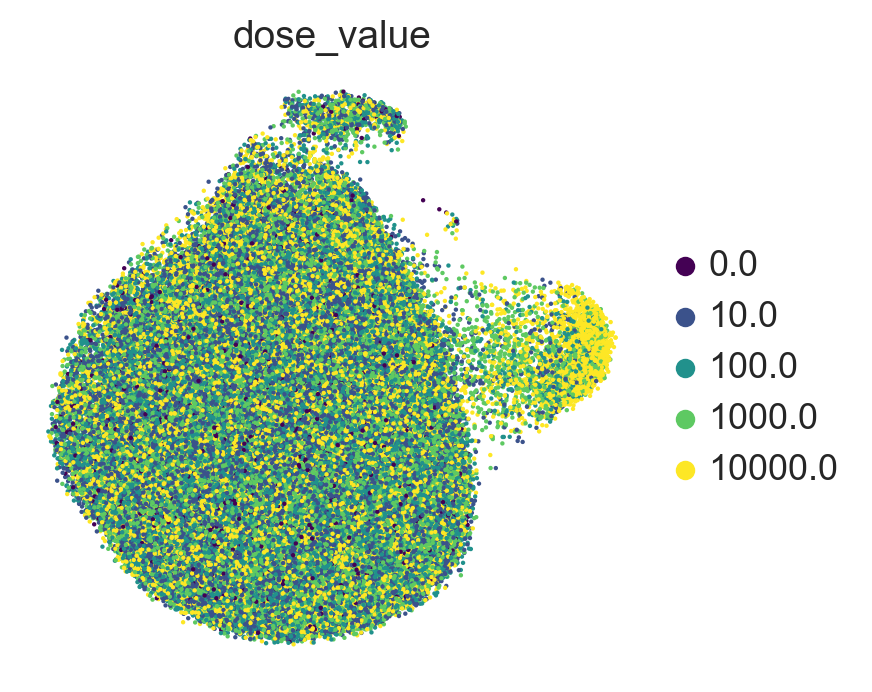

753


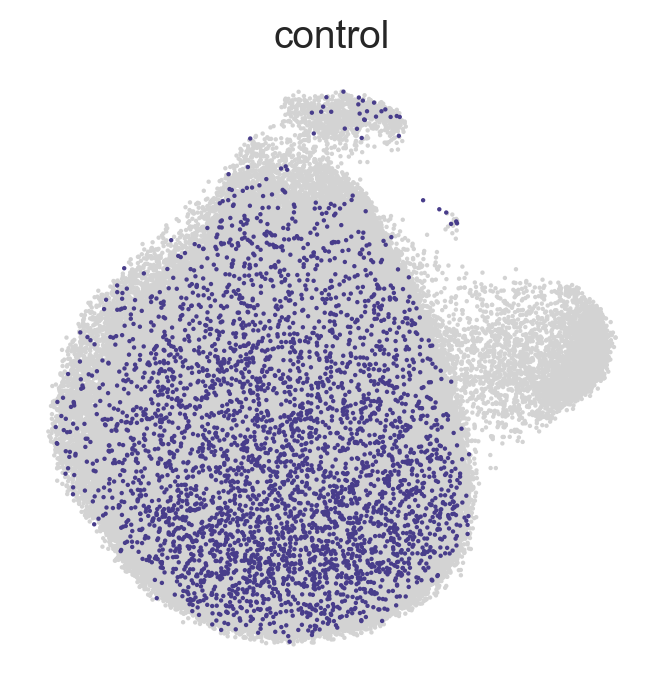

In [13]:
plot(adata, 'dose_value')

In [11]:
cell_line = 'MCF7'
adata = pt.data.srivatsan_2020_sciplex3()
adata = process_sciplex(adata, cell_line)

In [15]:
%%time
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

CPU times: user 14min, sys: 3min 43s, total: 17min 44s
Wall time: 7min 18s


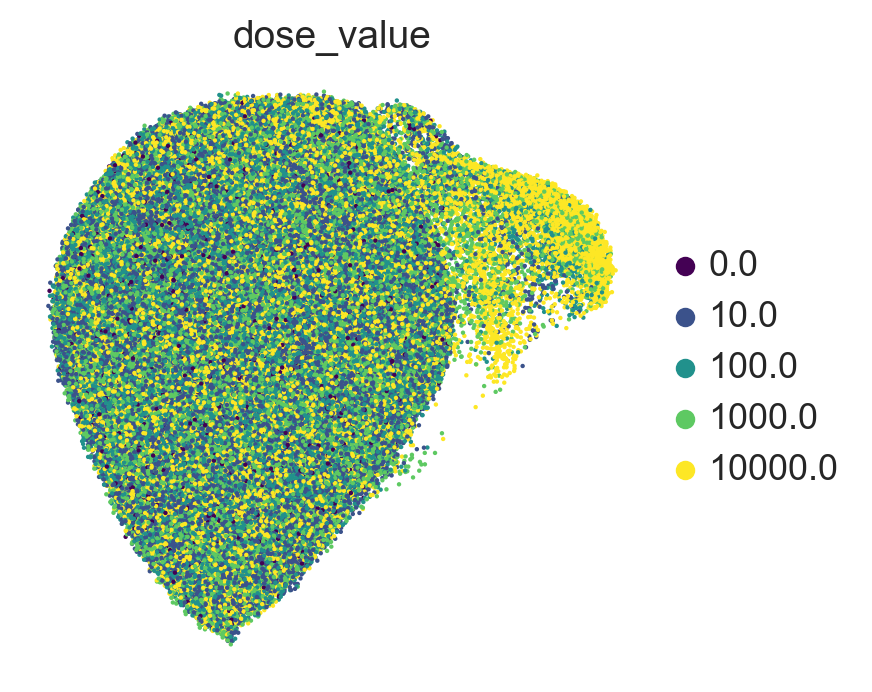

753


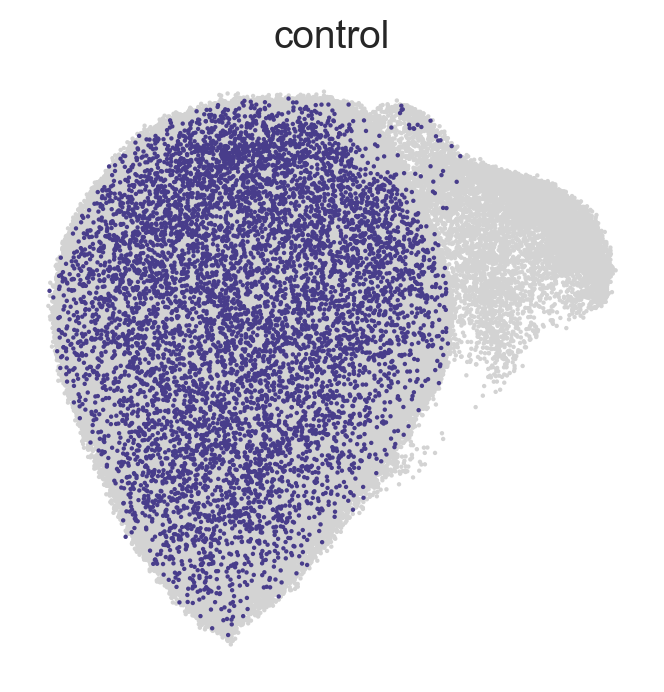

In [16]:
plot(adata, 'dose_value')

## schiebinger_2019_18day

In [48]:
adata = pt.data.schiebinger_2019_18day()

In [14]:
# take only the Dox and control conditions, representing full, "normal" reprogramming
adata = adata[adata.obs.perturbation.isin(['control', 'Dox']) & (~adata.obs.age.isin(['iPSC', 'D0', 'D0.5']))]
adata.obs['perturbation_old'] = adata.obs.perturbation
adata.obs['perturbation'] = adata.obs.age.replace({'D1':'control'})

adata.obs.perturbation.value_counts()

D8         11088
D2          9670
D4          8962
D6          8422
D3.5        8066
D5          7227
D4.5        7127
D2.5        6916
D3          6821
D5.5        6550
D7          6507
D7.5        5061
D15.5       4851
D16.5       4660
D17.5       4069
D15         3923
D18         3800
D14         3758
control     3735
D17         3678
D8.5        3573
D16         3442
D6.5        3111
D9          3079
D14.5       2723
D11         2612
D12         2429
D10         2419
D13.5       2373
D9.5        2297
D12.5       2253
D11.5       2242
D13         2146
D10.5       1986
D1.5        1956
Name: perturbation, dtype: int64

Plot an overview of the data.

In [15]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

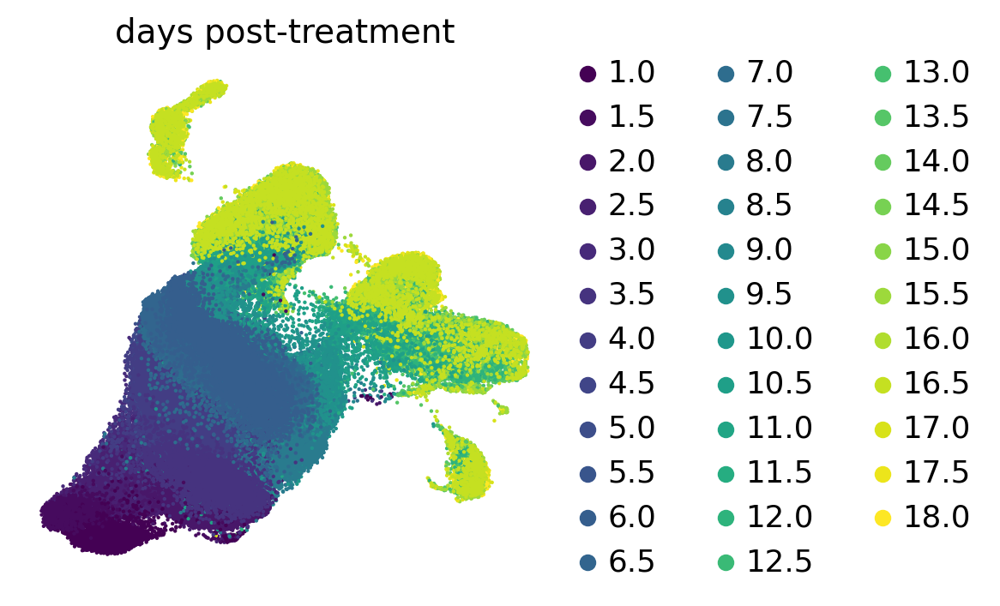

35


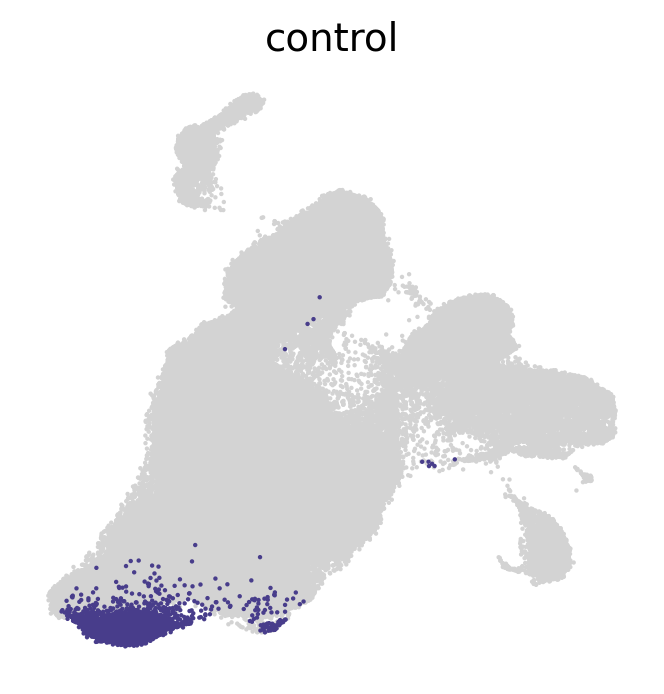

In [16]:
adata.obs['days post-treatment'] = [float(x[1:]) for x in adata.obs.age]
plot(adata, 'days post-treatment')

In [17]:
adata

AnnData object with n_obs × n_vars = 163532 × 27998
    obs: 'age', 'replicate', 'perturbation', 'GSM', 'cancer', 'organism', 'disease', 'tissue_type', 'perturbation_type', 'celltype', 'ncounts', 'ngenes', 'percent_mito', 'percent_ribo', 'nperts', 'perturbation_old', 'days post-treatment'
    var: 'ncounts', 'ncells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'days post-treatment_colors', 'perturbation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

## mcfarland

In [18]:
adata = pt.data.mcfarland_2020()

# subset to common timepoints and most frequently occurring cell line - no better options
adata = adata[adata.obs.time.isin(['6', '24']) & (adata.obs.cell_line == 'COLO680N')]
adata.obs['perturbation'] = adata.obs['perturbation'].astype(str) + '_' + adata.obs.time.astype(str)
adata.obs['perturbation'] = adata.obs.perturbation.replace({'control_24':'control', 'control_6':'control'})

adata.obs.perturbation.value_counts()

Output()

perturbation
control           541
Trametinib_24     378
AZD5591_24        179
Dabrafenib_24     148
Idasanutlin_24    129
Navitoclax_24     120
BRD3379_24        116
JQ1_24            115
Prexasertib_24    114
Bortezomib_24     113
Trametinib_6      112
Everolimus_24     108
Idasanutlin_6      99
Bortezomib_6       92
BRD3379_6          89
Taselisib_24       88
Afatinib_24        71
Gemcitabine_24     37
Name: count, dtype: int64

In [19]:
pd.crosstab(adata.obs.perturbation, adata[adata.obs.cell_line.isin(['LNCAPCLONEFGC', 'COV434', 'RCC10RGB', 'COLO680N', 'TEN', 'NCIH2347', 'CAOV3'])].obs.cell_line)

cell_line,COLO680N
perturbation,
AZD5591_24,179
Afatinib_24,71
BRD3379_24,116
BRD3379_6,89
Bortezomib_24,113
Bortezomib_6,92
Dabrafenib_24,148
Everolimus_24,108
Gemcitabine_24,37


Plot an overview of the data.

In [20]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

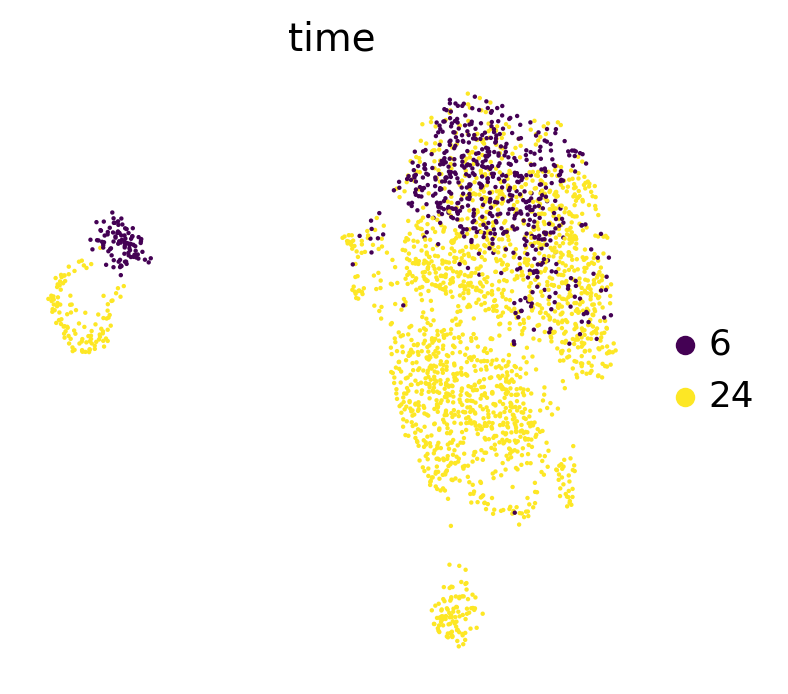

18


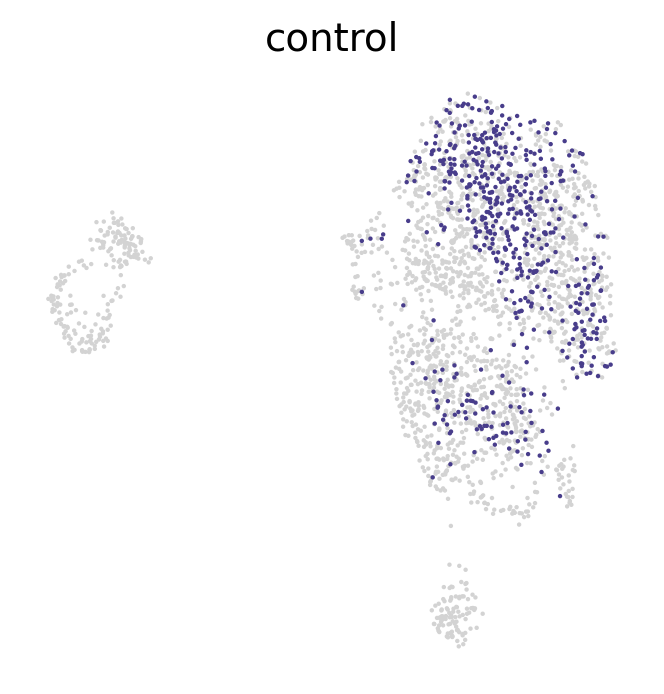

In [21]:
plot(adata, 'time')

In [22]:
adata

AnnData object with n_obs × n_vars = 2649 × 32738
    obs: 'DepMap_ID', 'cancer', 'cell_det_rate', 'cell_line', 'cell_quality', 'channel', 'disease', 'dose_unit', 'dose_value', 'doublet_CL1', 'doublet_CL2', 'doublet_GMM_prob', 'doublet_dev_imp', 'doublet_z_margin', 'hash_assignment', 'hash_tag', 'num_SNPs', 'organism', 'percent.mito', 'perturbation', 'perturbation_type', 'sex', 'singlet_ID', 'singlet_dev', 'singlet_dev_z', 'singlet_margin', 'singlet_z_margin', 'time', 'tissue_type', 'tot_reads', 'nperts', 'ngenes', 'ncounts', 'percent_mito', 'percent_ribo', 'chembl-ID'
    var: 'ensembl_id', 'ncounts', 'ncells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'time_colors', 'perturbation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

## norman

In [14]:
adata = pt.data.norman_2019()

In [24]:
adata.obs['perturbation'] = adata.obs.perturbation_name
adata.obs['n_guides'] = [int(s.count('+'))+1 for s in adata.obs.perturbation]

Plot an overview of the data.

In [25]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [26]:
adata.obs['n_guides'] = adata.obs['n_guides'].astype('category')

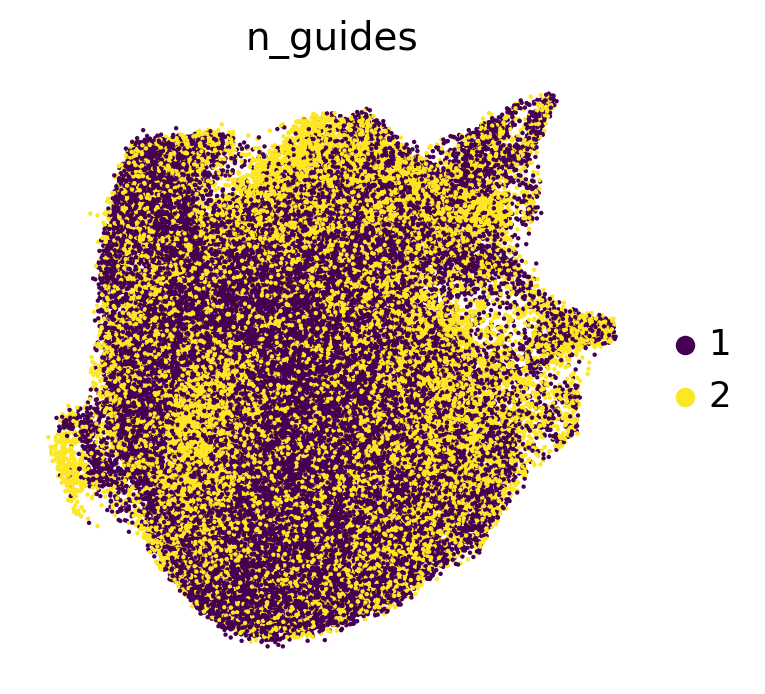

237


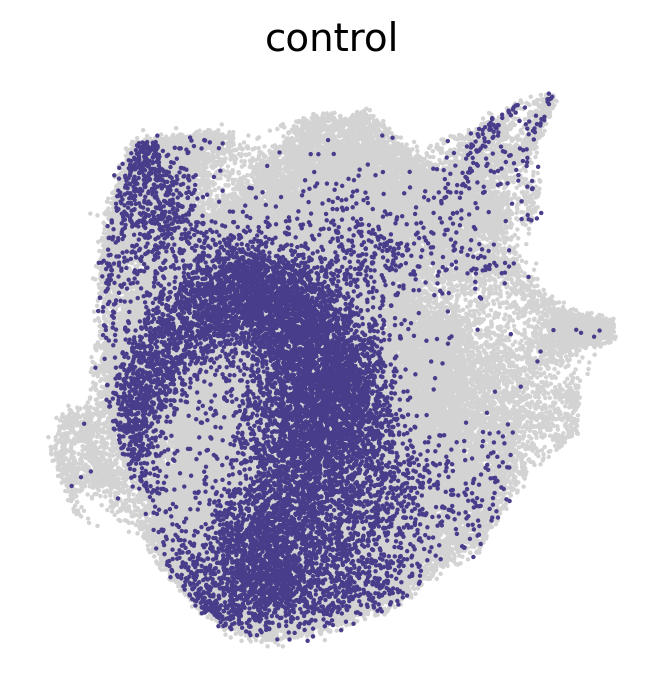

In [27]:
plot(adata, 'n_guides')

In [28]:
adata

AnnData object with n_obs × n_vars = 111255 × 19018
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', '

## garcia

Subset to the cell type with the greatest range of timepoints when filtering for celltype-timepoint pairs with >300 cells.

In [29]:
adata = sc.read('./data/garcia2022.h5ad')

adata = adata[adata.obs.cell_type == 'Ovarian interstitial cells']
adata.obs['perturbation'] = adata.obs.age.replace({8.6:'control'}).astype(str)

In [30]:
adata.obs.perturbation.value_counts()

16.0       6872
17.0       2644
13.0       2375
21.0       2268
10.0       2194
8.8        2153
12.0       1910
control    1784
14.0       1587
9.0         548
11.0        367
18.0        339
15.0         35
19.0         11
Name: perturbation, dtype: int64

In [31]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

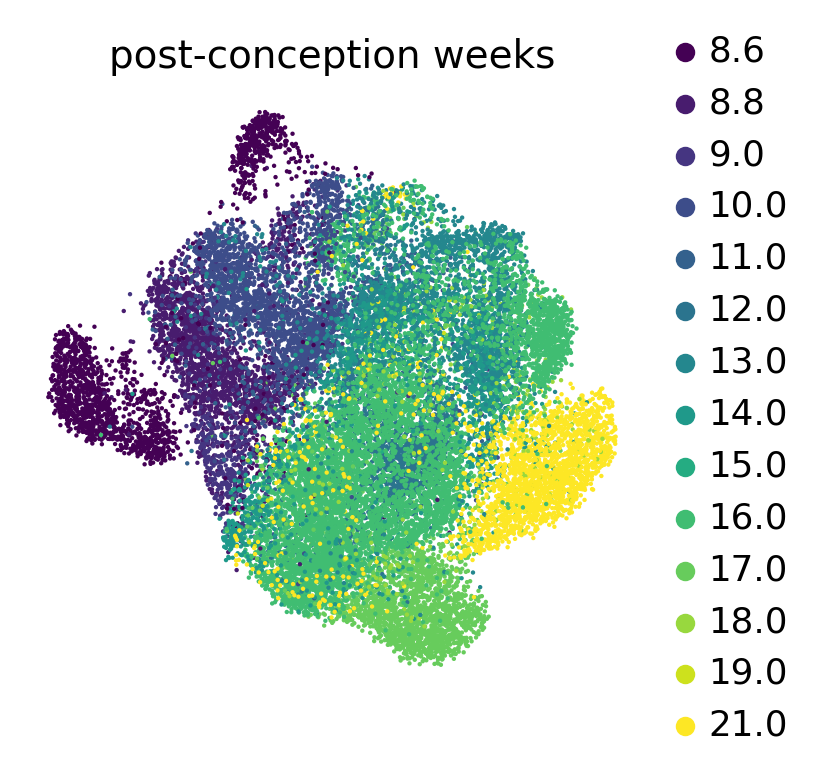

14


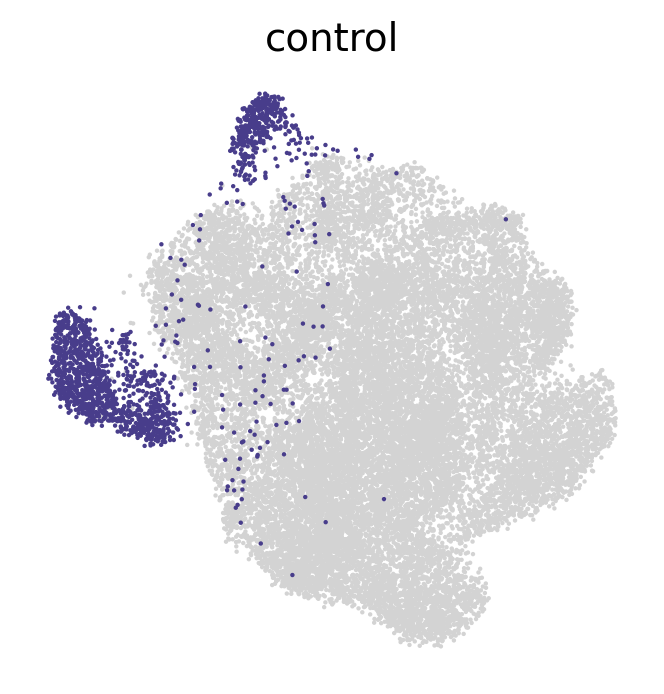

In [32]:
adata.obs['post-conception weeks'] = adata.obs['age'].astype('category')
plot(adata, 'post-conception weeks')

## satinha

In [33]:
adata = sc.read('./data/SantinhaPlatt2023_GSE236519_pooled_screen_CBh_temp.h5ad')
sc.pp.filter_genes(adata, min_cells=100)
adata = adata[~adata.obs.per_gene.isnull()]

included_cts = adata.obs.cell_types.value_counts()[adata.obs.cell_types.value_counts() > 1000].index
adata = adata[adata.obs.cell_types.isin(included_cts)]

adata.obs['perturbation'] = adata.obs.per_gene.replace({'Safe_H':'control'})

In [34]:
include = adata.obs.perturbation.value_counts()[adata.obs.perturbation.value_counts() > 1000].index
pd.crosstab(adata.obs.cell_types, adata.obs.perturbation)[include]

perturbation,Comt,Med15,control,Hic2,Ccdc74a,Pi4ka,Snap29,Dgcr2,Zdhhc8,Tmem191c,Lztr1,Dgcr8,Crkl,Scarf2,Ranbp1,Rimbp3,Arvcf,Txnrd2,Slc25a1
cell_types,,,,,,,,,,,,,,,,,,,
Astrocytes,229,159,149,154,124,118,121,96,124,109,118,111,102,109,93,90,86,51,85
Interneurons_Sst_Pvalb,886,726,619,572,556,531,510,571,538,526,504,526,504,449,404,375,427,432,389
Interneurons_Vip_Adarb2,260,182,170,171,164,159,158,172,149,149,139,136,135,140,96,124,101,104,103
Neurons_L_2_3,821,621,648,585,585,510,514,475,479,483,474,433,423,421,397,391,336,262,271
Neurons_L_5,597,455,474,454,392,435,395,366,362,339,348,328,359,313,284,299,292,273,259
Neurons_L_6,475,386,309,339,263,295,270,283,263,278,268,243,221,219,203,191,191,150,156
Oligodendrocytes,121,77,69,72,59,50,67,65,58,57,50,50,37,49,48,47,41,35,28


In [35]:
adata

AnnData object with n_obs × n_vars = 43988 × 20842
    obs: 'Barcode', 'lane', 'nCount_RNA', 'nFeature_RNA', 'cell_name', 'cell_types', 'cell_types_broad', 'cell_types_neuro', 'gRNA_read_count', 'gRNA_umi_count', 'per_gene', 'gRNAs', 'perturbation'
    var: 'n_cells'
    obsm: 'X_pca', 'X_umap'

In [36]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

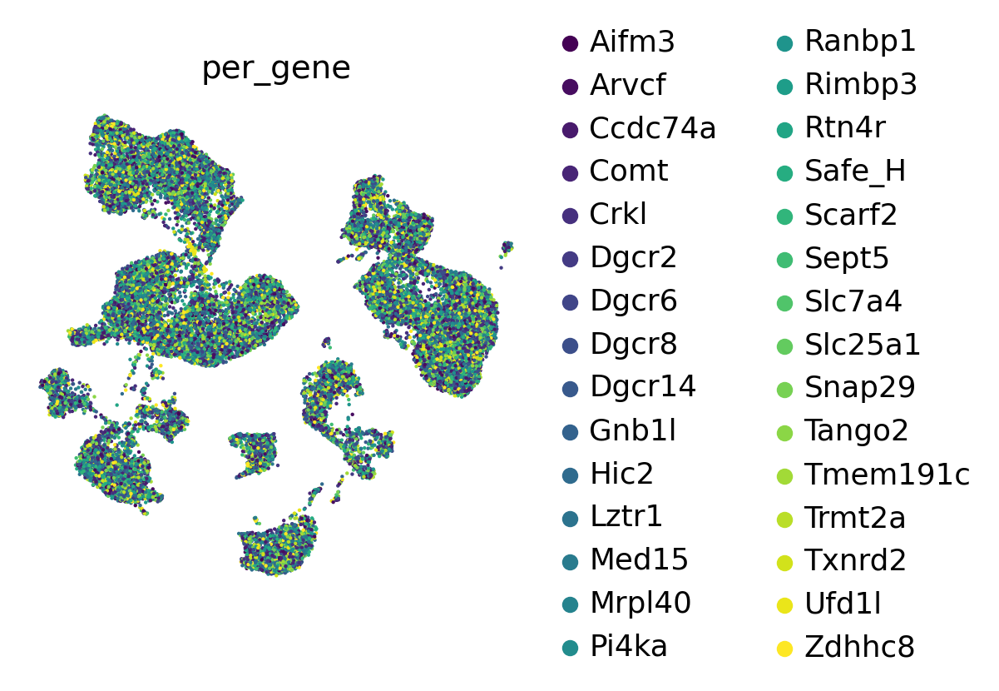

30


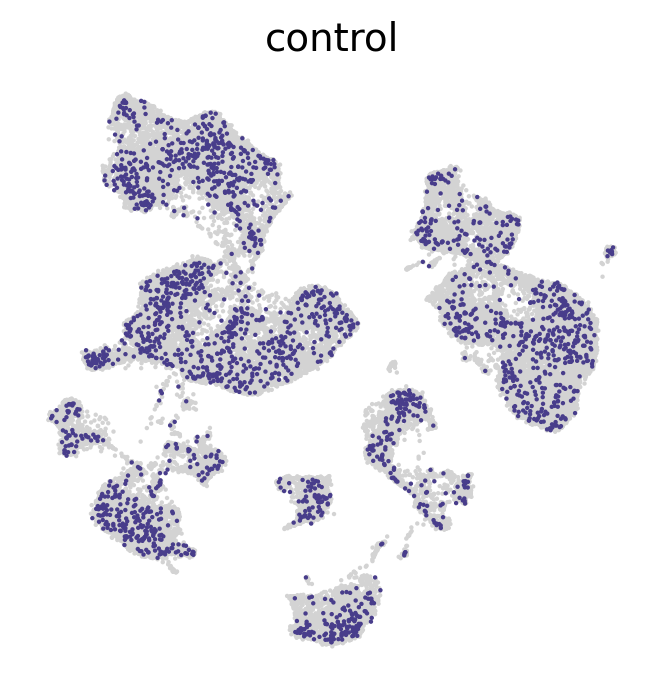

In [37]:
plot(adata, 'per_gene')

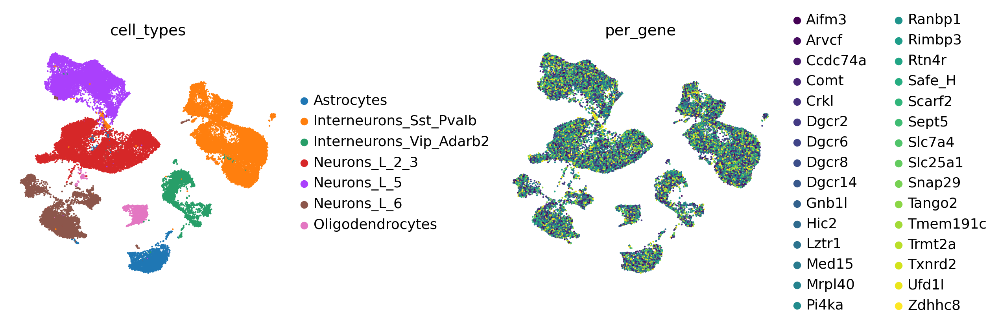

In [38]:
sc.pl.umap(adata, color=['cell_types', 'per_gene'], wspace=.6, size=10)

## Tahoe-100M

Filter to A549 cell line, which overlaps with sciplex3. Also include BT-474(breast) as a comparison to MCF7. Since there are no blood lines in here, we've arbitrarily selected the colorectal cell line HT-29.

In [64]:
%%time
import gc
sampled = []
for i in tqdm((range(1, 15))):
    plate = sc.read(f'/ictstr01/groups/ml01/workspace/ken_wang/100m/plate{i}_filtered.h5ad')  # these are the raw counts
    plate = plate[plate.obs.cell_name == 'HT-29'].copy()
    sc.pp.subsample(plate, .1)  # to a reasonable number
    plate.obs['plate'] = f'plate_{i}'
    sampled.append(plate)
    gc.collect()
    
adata = ad.concat(sampled)
adata.layers['counts'] = adata.X
adata.write('./data/Tahoe_HT29_only_full_genes.h5ad')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [1:29:43<00:00, 384.51s/it]


CPU times: user 1h 12min 44s, sys: 14min 23s, total: 1h 27min 7s
Wall time: 1h 29min 57s


In [65]:
adata

AnnData object with n_obs × n_vars = 225215 × 62710
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'bc1_well', 'bc2_well', 'bc3_well', 'id', 'drugname_drugconc', 'drug', 'INT_ID', 'NUM.SNPS', 'NUM.READS', 'demuxlet_call', 'BEST.GUESS', 'BEST.LLK', 'NEXT.GUESS', 'NEXT.LLK', 'DIFF.LLK.BEST.NEXT', 'BEST.POSTERIOR', 'SNG.POSTERIOR', 'cell_line', 'SNG.BEST.LLK', 'SNG.NEXT.GUESS', 'SNG.NEXT.LLK', 'SNG.ONLY.POSTERIOR', 'DBL.BEST.GUESS', 'DBL.BEST.LLK', 'DIFF.LLK.SNG.DBL', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'cell_line_orig', 'pass_filter', 'cell_name', 'plate'
    layers: 'counts'

### A549

In [50]:
adata = sc.read('./data/Tahoe_A549_only_full_genes.h5ad')
adata

AnnData object with n_obs × n_vars = 266442 × 62710
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'bc1_well', 'bc2_well', 'bc3_well', 'id', 'drugname_drugconc', 'drug', 'INT_ID', 'NUM.SNPS', 'NUM.READS', 'demuxlet_call', 'BEST.GUESS', 'BEST.LLK', 'NEXT.GUESS', 'NEXT.LLK', 'DIFF.LLK.BEST.NEXT', 'BEST.POSTERIOR', 'SNG.POSTERIOR', 'cell_line', 'SNG.BEST.LLK', 'SNG.NEXT.GUESS', 'SNG.NEXT.LLK', 'SNG.ONLY.POSTERIOR', 'DBL.BEST.GUESS', 'DBL.BEST.LLK', 'DIFF.LLK.SNG.DBL', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'cell_line_orig', 'pass_filter', 'cell_name', 'plate', 'dose (uM)', 'perturbation'
    uns: 'dose (uM)_colors', 'log1p', 'neighbors', 'perturbation_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [47]:
adata.obs['dose (uM)'] = adata.obs['drugname_drugconc'].apply(lambda x: ast.literal_eval(x)[0][1])
adata.obs['perturbation'] = adata.obs.drug.astype(str) + '_' + adata.obs['dose (uM)'].astype(str)
adata.obs['perturbation'] = adata.obs.perturbation.replace({'DMSO_TF_0.0':'control'})
adata[adata.obs['plate'].eq('plate_12') & adata.obs['perturbation'].eq('control')].obs['perturbation'].value_counts()

perturbation
control    397
Name: count, dtype: int64

In [37]:
'DMSO_TF' in adata.obs.drug.value_counts().index

True

In [38]:
'DMSO_TF' in adata[adata.obs['plate'] == 'plate_12'].obs.drug.value_counts().index

True

Series([], Name: count, dtype: int64)

In [44]:
import ast
adata.obs['dose (uM)'] = adata.obs['drugname_drugconc'].apply(lambda x: ast.literal_eval(x)[0][1])
adata.obs['perturbation'] = adata.obs.drug.replace({'DMSO_TF':'control'})

In [58]:
adata.obs['dose (uM)'].value_counts()

dose (uM)
5.00    95431
0.50    84358
0.05    80336
0.00     6317
Name: count, dtype: int64

In [59]:
%%time
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.
CPU times: user 11min 47s, sys: 3min 28s, total: 15min 16s
Wall time: 7min 33s


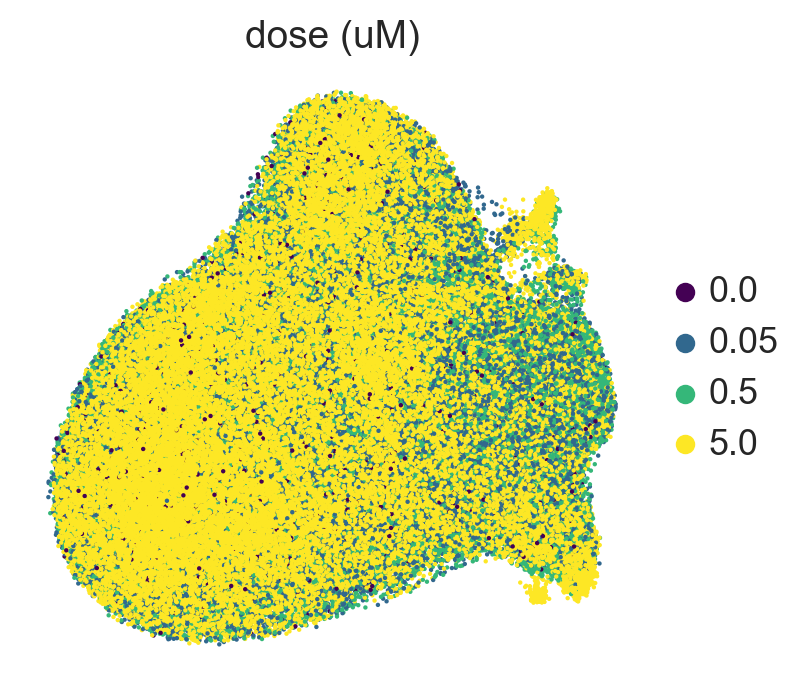

380


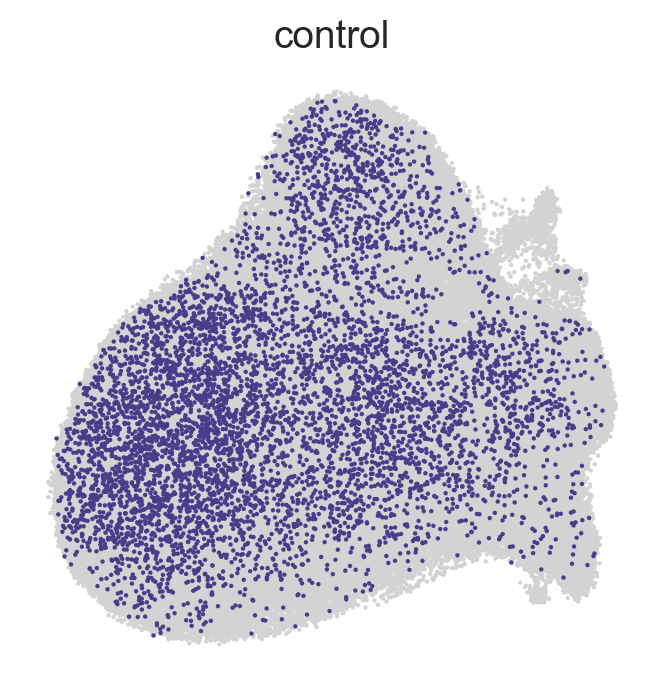

In [60]:
plot(adata, 'dose (uM)')

### HT-29

         Falling back to preprocessing with `sc.pp.pca` and default params.


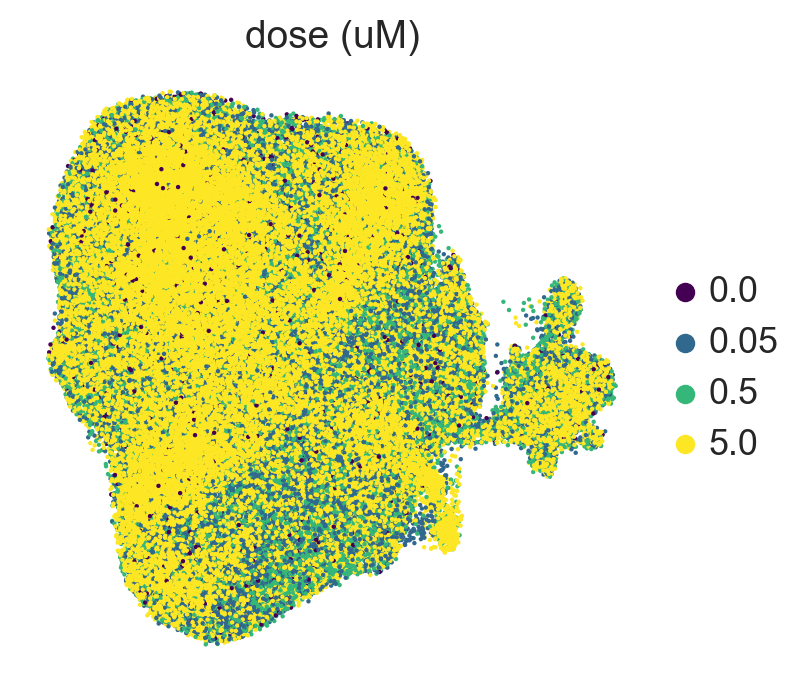

380


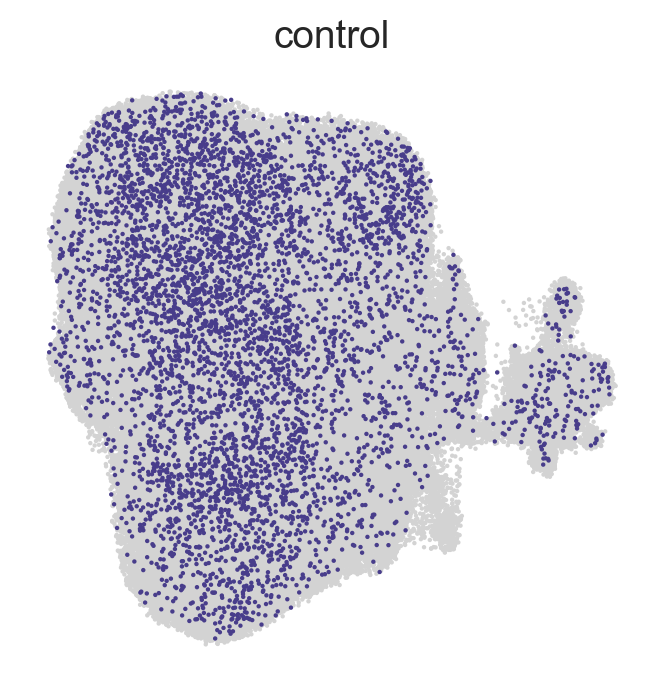

In [66]:
adata = sc.read('./data/Tahoe_HT29_only_full_genes.h5ad')

adata.obs['dose (uM)'] = adata.obs['drugname_drugconc'].apply(lambda x: ast.literal_eval(x)[0][1])
adata.obs['perturbation'] = adata.obs.drug.replace({'DMSO_TF':'control'})

adata.obs['dose (uM)'].value_counts()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

plot(adata, 'dose (uM)')

### BT-474

         Falling back to preprocessing with `sc.pp.pca` and default params.


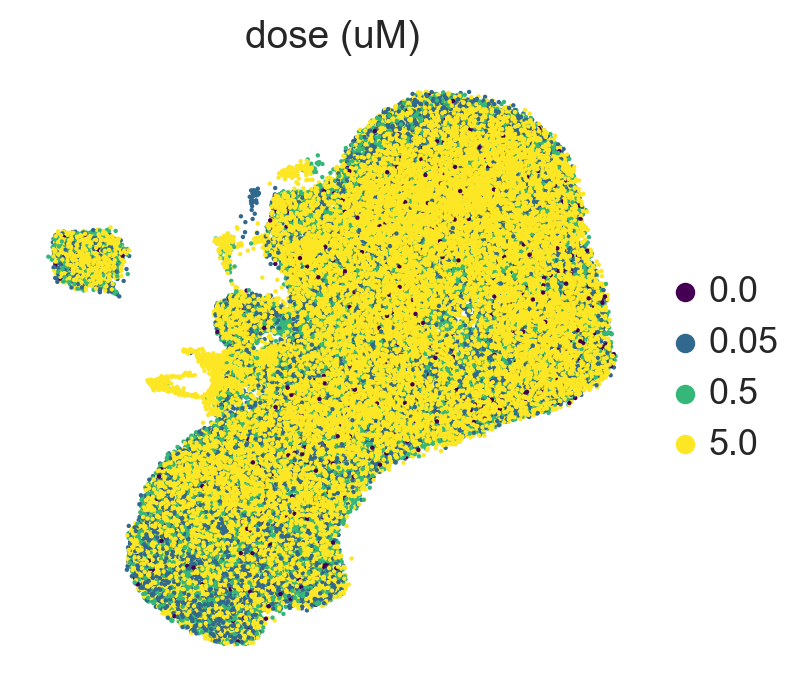

380


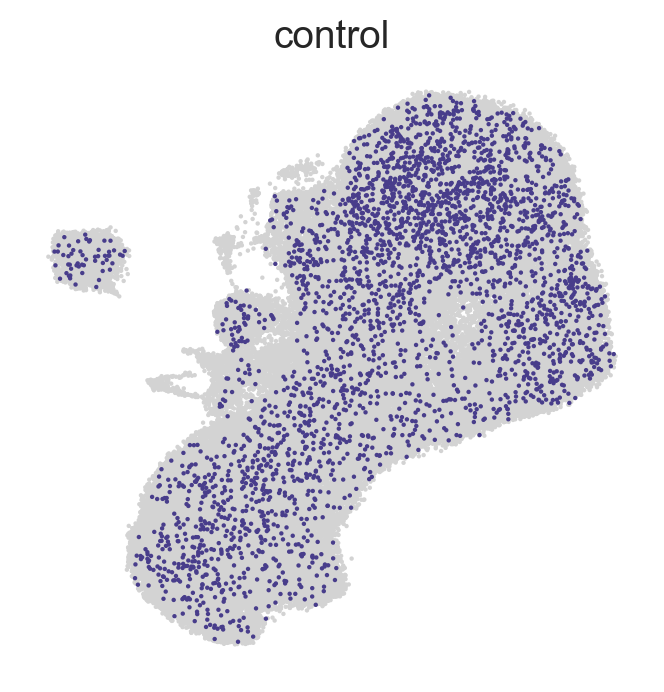

In [67]:
adata = sc.read('./data/Tahoe_BT474_only_full_genes.h5ad')

adata.obs['dose (uM)'] = adata.obs['drugname_drugconc'].apply(lambda x: ast.literal_eval(x)[0][1])
adata.obs['perturbation'] = adata.obs.drug.replace({'DMSO_TF':'control'})

adata.obs['dose (uM)'].value_counts()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

plot(adata, 'dose (uM)')

## Saunders

In [9]:
adata = sc.read('./data/saunders_spatial_2025.h5ad')
adata

AnnData object with n_obs × n_vars = 79179 × 209
    obs: 'fov', 'x', 'y', 'global_x', 'global_y', 'area', 'batch', 'cell_type', 'cluster_type', 'singlet_name', 'singlet_gene', 'bc3', 'bc1', 'n_thresh3', 'n_thresh1', 'perturbation'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mean', 'std'
    uns: 'cluster_type_colors', 'log1p', 'neighbors', 'pca', 'pl112_counts', 'singlet_gene_colors', 'umap', 'batch_colors', 'perturbation_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_orig', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

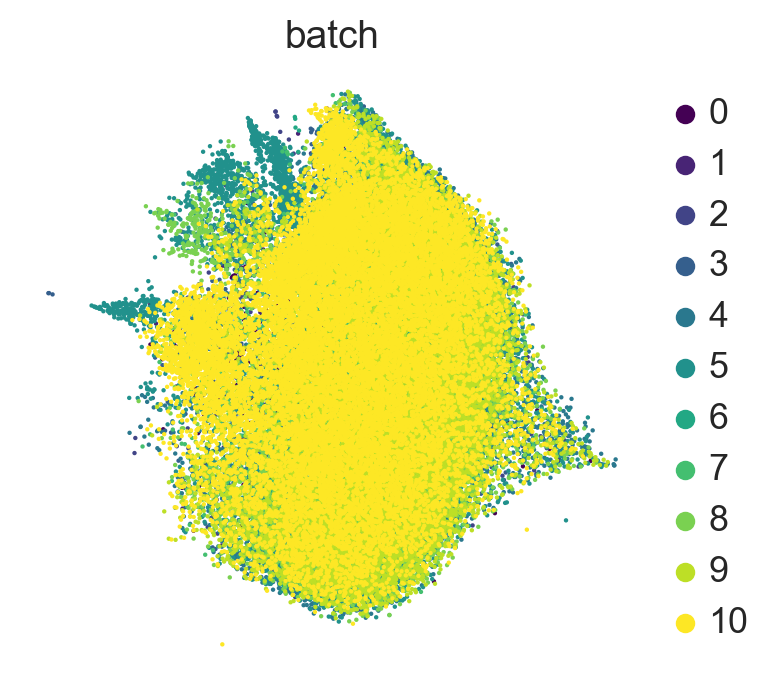

203


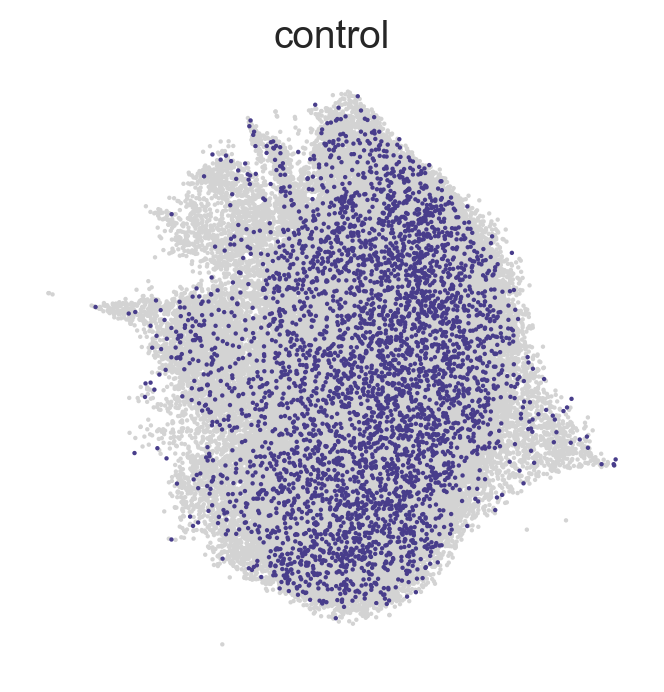

In [7]:
adata.obs['perturbation'] = adata.obs.singlet_gene
plot(adata, 'batch')

## simulated

In [39]:
import anndata as ad
from utils import annotate

In [40]:
adata = ad.AnnData(pd.read_csv('../splatter_sim_dropout.csv').T, obs=pd.read_csv('../splatter_sim_obs_dropout.csv'))

params = pd.read_csv('../splatter_sim_params_dropout.csv')
annotate(adata, params)

sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_genes=200)

In [41]:
scanpy_setup(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

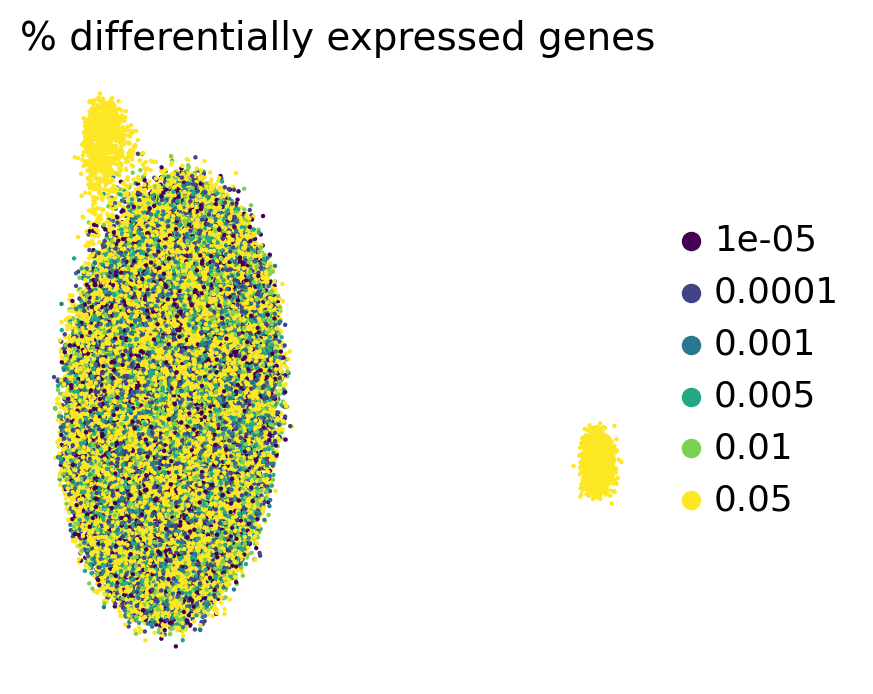

25


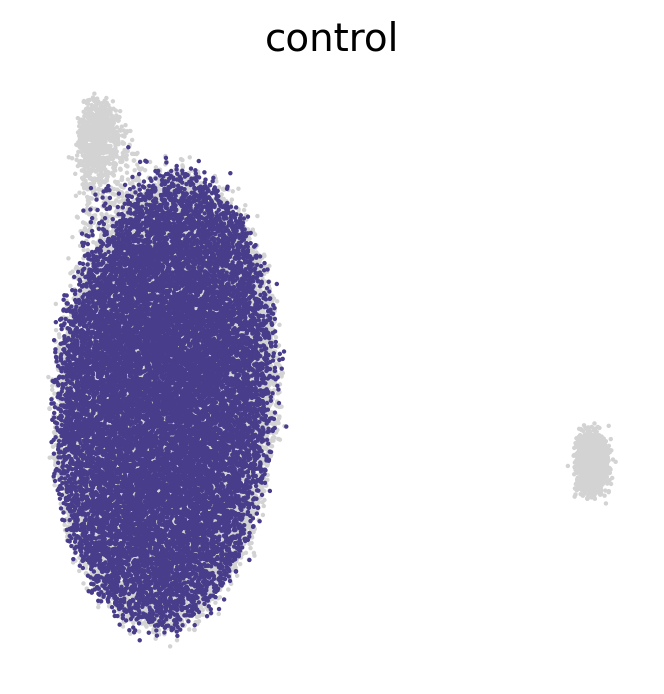

In [42]:
adata.obs['% differentially expressed genes'] = adata.obs.DEProb
plot(adata, '% differentially expressed genes')

## summary plots

In [11]:
df = pd.read_csv('dataset_table.csv')  # generated manually from the above

In [12]:
df

,First Author,Year,System (subset to),Biological Covariate,Description of Control,Number of Interventions,Minimum Cells
0,Schiebinger,2019,18-day MEF to iPSC reprogramming,post-reprogramming days,day 1 of OSKM induction,34,400
1,Garcia,2022,Ovarian interstitial cells,post-conception weeks,8.6 weeks post-conception,13,300
2,Norman,2019,leukemia cancer cell line (K562),number of unique guides,non-targeting gRNA,236,390
3,Santinha,2023,AAV-Perturb-seq in mouse brain,NaN,safe-harbor gRNA,29,480
4,Srivatsan,2020,breast cancer cell line (MCF7),small molecule dose,DMSO,752,270
5,Srivatsan,2020,leukemia cancer cell line (K562),small molecule dose,DMSO,752,270
6,Srivatsan,2020,lung cancer cell line (A549),small molecule dose,DMSO,752,270
7,Zhang,2025,lung cancer cell line (A549),small molecule dose,DMSO,380,300
8,Zhang,2025,colorectal adenocarcinoma cell line (HT29),small molecule dose,DMSO,380,300
9,Zhang,2025,breast cancer cell line (BT474),small molecule dose,DMSO,380,300


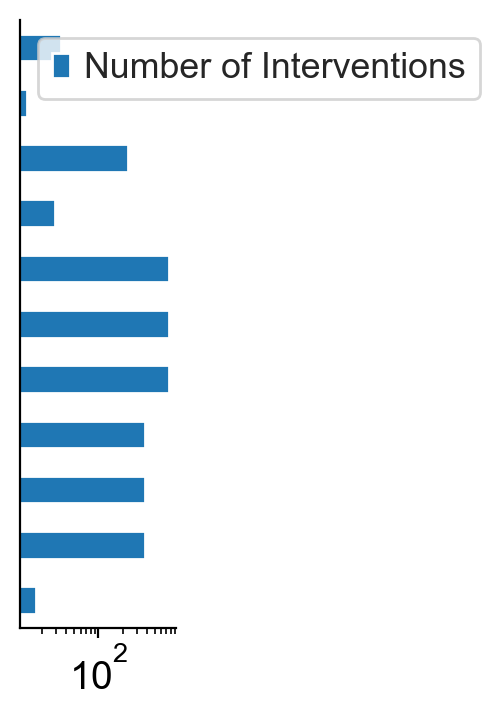

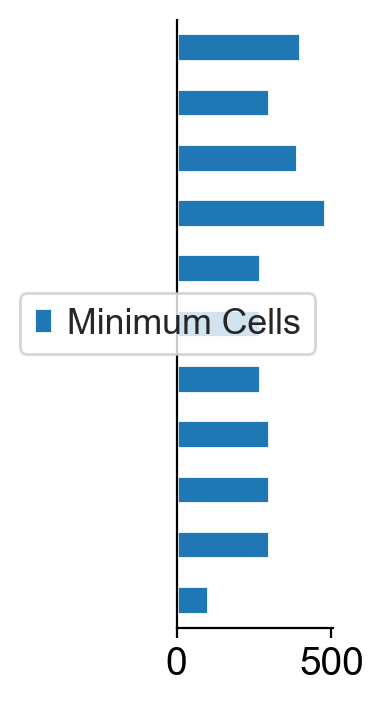

In [47]:
for col in ['Number of Interventions', 'Minimum Cells']:
    fig, ax = plt.subplots(figsize=(1, 4))
    df[::-1].plot.barh('First Author', col, ax=ax)
    if col != 'Minimum Cells':
        plt.xscale('log')
    plt.grid()
    plt.yticks([])
    plt.ylabel(None)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.savefig(f'figures/dataset_{col}_bar.svg')